Setup and necessary packages

In [2]:
# Downgrade pip to a version before the strict metadata check was enforced.
# This will allow it to install hdmf-zarr despite its typo.
!pip install 'pip<24.1'

DEPRECATION: hdmf-zarr 0.1.6 has a non-standard dependency specifier pynwb>=2.0.0setuptools. pip 24.1 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of hdmf-zarr or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063


In [3]:
# Clean install of AJILE12 on Google Colab; this is to prevent overwriting conflicts. You can run this once for each new run instance on colab.
%cd /
 # removes old version of AJILE12 if it exists
%rm -rf /content/Neuromatch-AJILE12/
# change to content directory where AJILE12 will be installed
%cd /content

/
/content


In [4]:
### if running on Google Colab, run this cell once, then restart the runtime and run the rest of the notebook
import os
if "COLAB_GPU" in os.environ:
    !git clone https://github.com/neurovium/Neuromatch-AJILE12
    %cd Neuromatch-AJILE12
    %pip install -e .

Cloning into 'Neuromatch-AJILE12'...
remote: Enumerating objects: 323, done.
remote: Counting objects: 100% (25/25), done.
remote: Compressing objects: 100% (23/23), done.
remote: Total 323 (delta 10), reused 0 (delta 0), pack-reused 298 (from 1)
Receiving objects: 100% (323/323), 10.07 MiB | 17.56 MiB/s, done.
Resolving deltas: 100% (144/144), done.
/content/Neuromatch-AJILE12
Obtaining file:///content/Neuromatch-AJILE12
  Preparing metadata (setup.py) ... done
  Using cached scipy-1.10.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (58 kB)
Using cached scipy-1.10.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (34.1 MB)
DEPRECATION: hdmf-zarr 0.1.6 has a non-standard dependency specifier pynwb>=2.0.0setuptools. pip 24.1 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of hdmf-zarr or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found a

In [12]:
# Numerical and plotting packages
import seaborn as sns
import numpy as np
import pandas as pd
import statsmodels.api as sm
import natsort
import matplotlib.pyplot as plt
from scipy.signal import sosfiltfilt, butter, hilbert

In [2]:
# Libraries needed for this notebook to interact with the DANDI API
from pynwb import NWBHDF5IO
from dandi.dandiapi import DandiAPIClient

# Libraries needed for this notebook to interact with NWB events
from ndx_events import LabeledEvents, AnnotatedEventsTable, Events

# FSSpec is a library that allows us to read files from the cloud
import fsspec

# NWB is based on HF5, so we need this library to read NWB files
import h5py

/usr/local/lib/python3.11/dist-packages/requests/__init__.py:102: RequestsDependencyWarning: urllib3 (1.26.20) or chardet (5.2.0)/charset_normalizer (2.0.12) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({})/charset_normalizer ({}) doesn't match a supported "


In [3]:
# Toolbox for data analysis
import mne

Data streaming

In [4]:
# Subject and session number for loading dataThese parameters can be adjusted to analyze other electrodes, frequency bands, behavior types, participants, sessions, etc.
# Example:
# Select data from participant 1, session 3 only during times that the participant was eating.
# ECoG data will be converted to spectral power in the gamma band (80-100 Hz) for electrode 7, which is located over the motor cortex.
# We will also look at the vertical velocity of the right wrist.


sbj, session = 1, 3  # participant 1, session 3
behavior_type = 'Eat' # only analyze data during eating
neural_freq_range = [80, 100]  # Frequency band of interest in Hz
ecog_ch_num = 7 # electrode number over motor cortex
keypoint_of_interest = 'R_Wrist' # right wrist movement
pose_direction = 'vertical'  # 'vertical' or 'horizontal'

In [5]:
# You can read specific sections within individual data files directly from remote stores such as the DANDI Archive.
# This is especially useful for reading small pieces of data from a large NWB file stored remotely. First, you will need to get the location of the file.
# Now you can get the url of a particular NWB file using the dandiset ID and the path of that file within the dandiset.
with DandiAPIClient() as client:
    asset = client.get_dandiset("000055").get_asset_by_path(
        "sub-{0:>02d}/sub-{0:>02d}_ses-{1:.0f}_behavior+ecephys.nwb".format(sbj, session)
    )
    s3_path = asset.get_content_url(follow_redirects=1, strip_query=True)

# s3_path is the url of the file on the DANDI Archive. You can now use this url to read the file using pynwb.
# Note that this url path may change if the file is updated on the DANDI Archive. ALWAYS use the "dandiset ID" and "path" to the file within the dandiset to get the url.
s3_path

'https://dandiarchive.s3.amazonaws.com/blobs/e54/21f/e5421ff3-05f6-4d5e-a884-6d3e57a11951'

In [6]:
# You can also read specific sections within individual data files directly from remote stores such as the DANDI Archive.
from fsspec.implementations.cached import CachingFileSystem

# Note, caching is set once per access. If you want to change the cache location, you will need to restart the kernel.
fs = CachingFileSystem(
    fs=fsspec.filesystem("http"),
    cache_storage="nwb-cache",  # Local folder for the cache
)

f = fs.open(s3_path, "rb")
file = h5py.File(f)
io = NWBHDF5IO(file=file, mode='r', load_namespaces=True)
nwbfile = io.read()

/usr/local/lib/python3.11/dist-packages/hdmf/spec/namespace.py:531: UserWarning: Ignoring cached namespace 'hdmf-common' version 1.4.0-alpha because version 1.6.0 is already loaded.
  warn("Ignoring cached namespace '%s' version %s because version %s is already loaded."
/usr/local/lib/python3.11/dist-packages/hdmf/spec/namespace.py:531: UserWarning: Ignoring cached namespace 'core' version 2.2.5 because version 2.6.0-alpha is already loaded.
  warn("Ignoring cached namespace '%s' version %s because version %s is already loaded."
/usr/local/lib/python3.11/dist-packages/hdmf/spec/namespace.py:531: UserWarning: Ignoring cached namespace 'hdmf-experimental' version 0.1.0 because version 0.3.0 is already loaded.
  warn("Ignoring cached namespace '%s' version %s because version %s is already loaded."


In [74]:
print(nwbfile)

root pynwb.file.NWBFile at 0x134135914134416
Fields:
  acquisition: {
    ECGL <class 'pynwb.base.TimeSeries'>,
    ECGR <class 'pynwb.base.TimeSeries'>,
    EOGL <class 'pynwb.base.TimeSeries'>,
    EOGR <class 'pynwb.base.TimeSeries'>,
    ElectricalSeries <class 'pynwb.ecephys.ElectricalSeries'>
  }
  devices: {
    ECG <class 'pynwb.device.Device'>,
    EOG <class 'pynwb.device.Device'>,
    GRID <class 'pynwb.device.Device'>,
    LAT <class 'pynwb.device.Device'>,
    LID <class 'pynwb.device.Device'>,
    LMT <class 'pynwb.device.Device'>,
    LPT <class 'pynwb.device.Device'>,
    LTO <class 'pynwb.device.Device'>
  }
  electrode_groups: {
    ECG <class 'pynwb.ecephys.ElectrodeGroup'>,
    EOG <class 'pynwb.ecephys.ElectrodeGroup'>,
    GRID <class 'pynwb.ecephys.ElectrodeGroup'>,
    LAT <class 'pynwb.ecephys.ElectrodeGroup'>,
    LID <class 'pynwb.ecephys.ElectrodeGroup'>,
    LMT <class 'pynwb.ecephys.ElectrodeGroup'>,
    LPT <class 'pynwb.ecephys.ElectrodeGroup'>,
    LTO 

In [7]:
# Specific information about the electrode of interest can be accessed using the electrode number.
nwbfile.electrodes[ecog_ch_num]
interval_endpoints = nwbfile.epochs.columns[0].data[:2].astype(int)

endpoints = np.vstack((nwbfile.epochs.columns[0].data[:-1], nwbfile.epochs.columns[0].data[1:])).T
#print(nwbfile.epochs.columns[0].data.shape)
#print(endpoints)

In [89]:
print(nwbfile.processing["behavior"])

reach_events = nwbfile.processing["behavior"].data_interfaces["ReachEvents"]
print(reach_events)
timestamps_re = reach_events.timestamps[:] # the timing in s of each reach
print(type(timestamps_re), timestamps_re.shape)

neural_data = nwbfile.acquisition['ElectricalSeries'].data
sampling_rate = nwbfile.acquisition['ElectricalSeries'].rate

pre_time = 2 # s
post_time = 2 # s

# Event times are given in seconds, but the ECoG data we are given is given in
# samples. Since the data was sampled in 500 samples/second, we can find the
# events in our data by multiplying event times by sampling rate 500 Hz.

# convert seconds in
pre_samples = int(pre_time * sampling_rate)
post_samples = int(post_time * sampling_rate)
total_samples = neural_data.shape[0]
print(total_samples)

event_epochs = []

behavior pynwb.base.ProcessingModule at 0x134135914339280
Fields:
  data_interfaces: {
    Position <class 'pynwb.behavior.Position'>,
    ReachEvents <class 'ndx_events.events.Events'>
  }
  description: pose data

ReachEvents ndx_events.events.Events at 0x134135913819344
Fields:
  description: r_wrist
  resolution: 0.002
  timestamps: <HDF5 dataset "timestamps": shape (156,), type "<f8">
  unit: seconds

<class 'numpy.ndarray'> (156,)
43200000


In [73]:
for event_time in timestamps_re:
    # time to sample idx
    event_index = int(event_time * sampling_rate)
    start_idx = event_index - pre_samples
    end_idx = event_index + post_samples

    if start_idx >= 0 and end_idx < total_samples:
        epoch = neural_data[start_idx:end_idx]
        event_epochs.append(epoch)

event_epochs = np.array(event_epochs)  #(n_events, epoch_length, [channels])

In [49]:
print(event_epochs.shape) # 156 wrist events
print(epoch.shape) # 1000x94, we have 2 second pre- and 2 second post-event, corresponding to 500+500=1000 samples. 94 is the number of channels.

(156, 2000, 94)
(2000, 94)


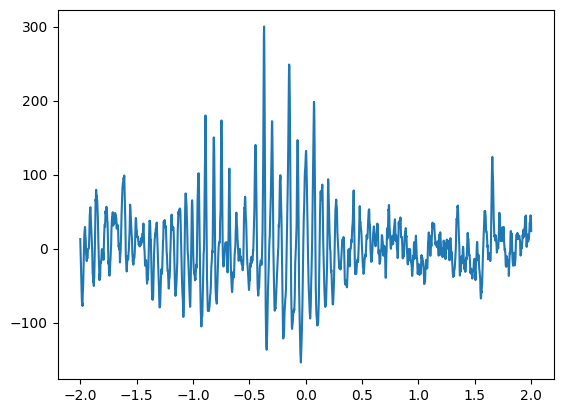

In [50]:
time_vector = np.linspace(-pre_time, post_time, event_epochs.shape[1])
#for i in event_epochs.shape[0]:
channel_7 = event_epochs[0, :, 7]
plt.plot(time_vector, channel_7)


In [51]:
#this is just a snippet of code I copied from the previous notebook to get the sampling frequency of the video
keypoints = list(nwbfile.processing['behavior'].data_interfaces['Position'].spatial_series.keys())
assert keypoint_of_interest in keypoints
assert pose_direction in ['vertical', 'horizontal']
keypoint_series = nwbfile.processing['behavior'].data_interfaces['Position'].spatial_series[keypoint_of_interest]
sampling_rate_keypoint = keypoint_series.rate  # Hz
keypoint_velocity = []

print(keypoint_of_interest)


R_Wrist


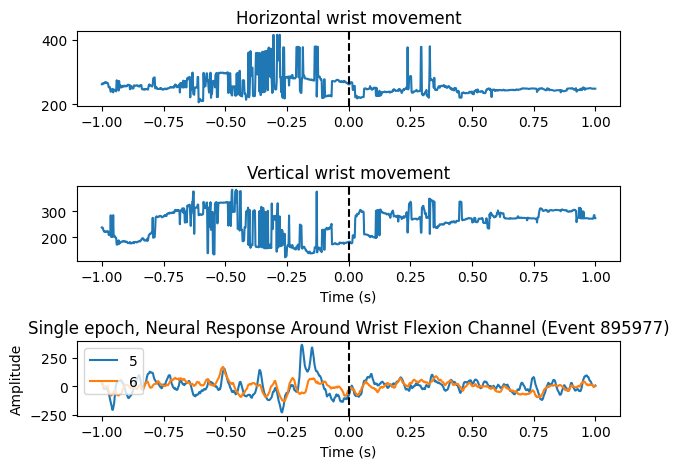

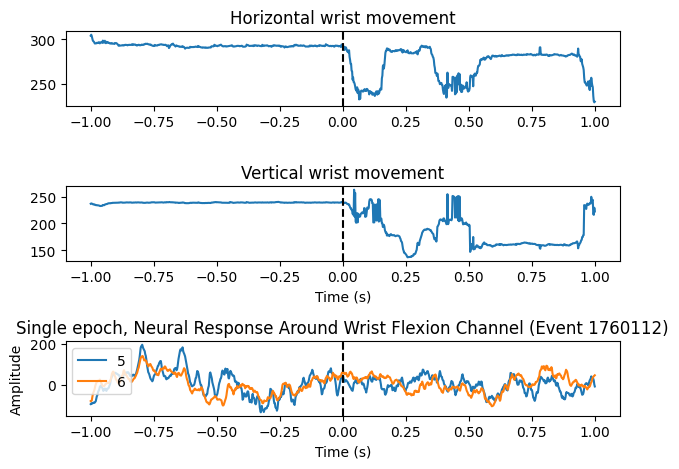

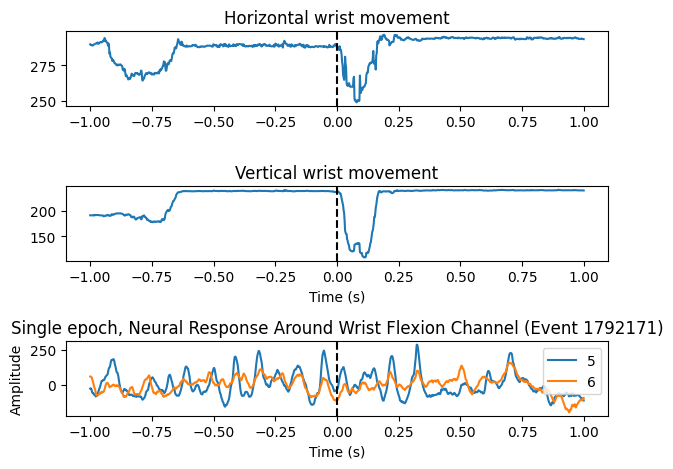

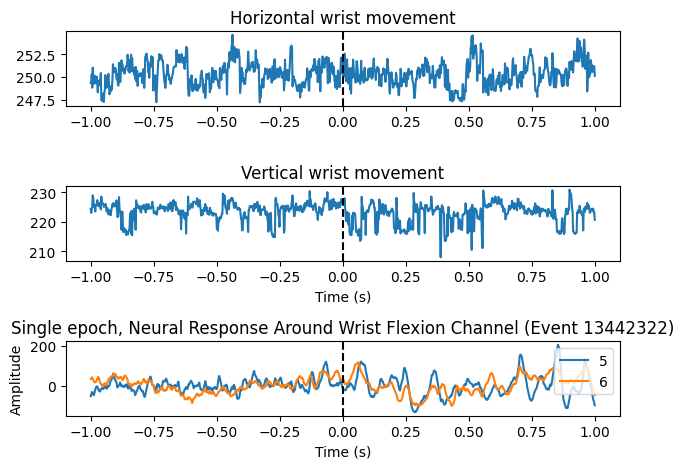

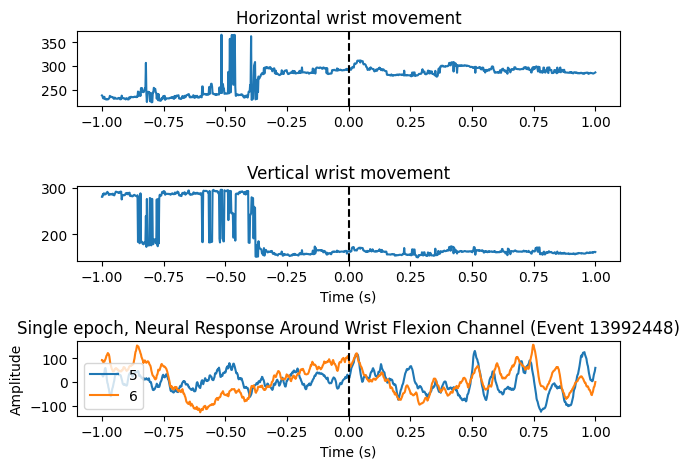

...

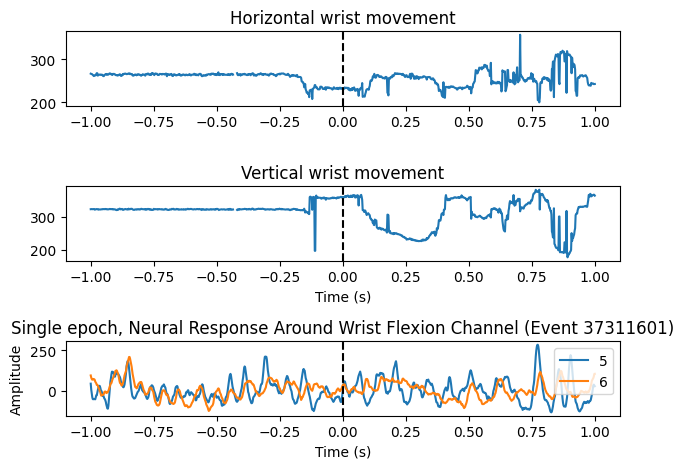

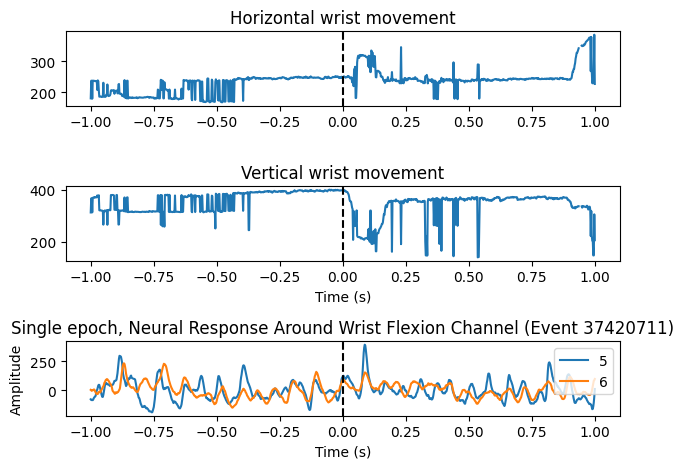

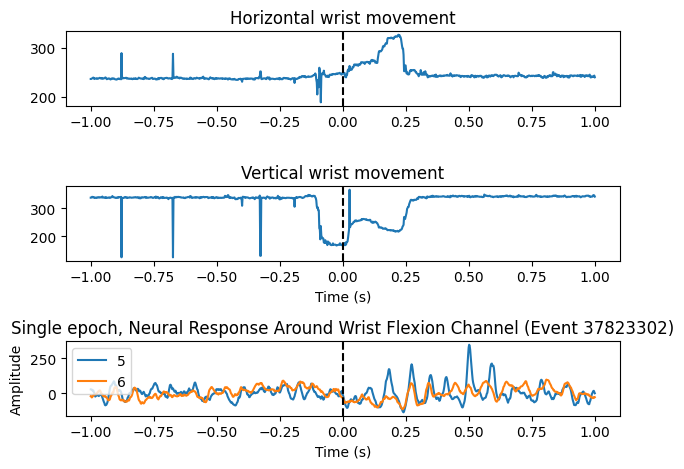

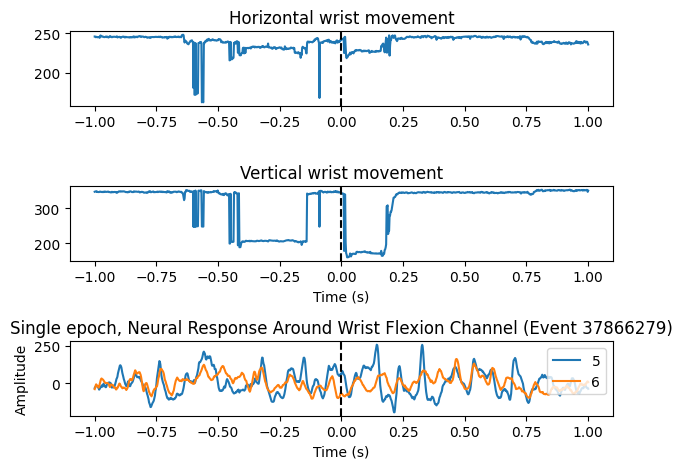

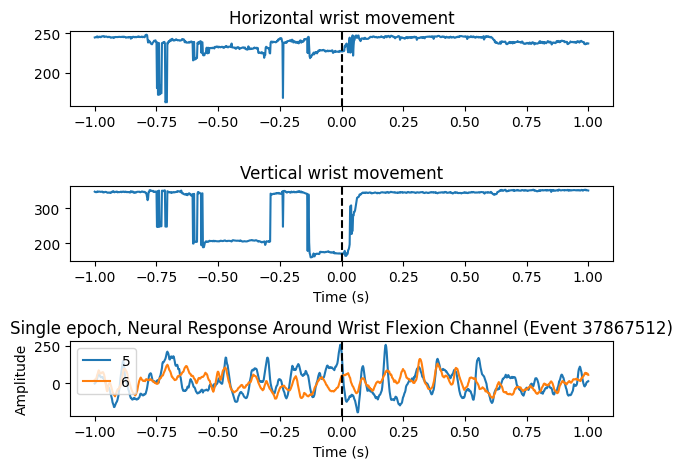

In [15]:
#this is just a snippet of code I copied from the previous notebook to get the sampling frequency of the video
keypoints = list(nwbfile.processing['behavior'].data_interfaces['Position'].spatial_series.keys())
assert keypoint_of_interest in keypoints
assert pose_direction in ['vertical', 'horizontal']
keypoint_series = nwbfile.processing['behavior'].data_interfaces['Position'].spatial_series[keypoint_of_interest]
sampling_rate_keypoint = keypoint_series.rate  # Hz
keypoint_velocity = []

# the y-axis for the wrist movement plots are likely pixel coordinates.

for event_time in timestamps_re:

    event_index = int(event_time * sampling_rate_keypoint)
    start_idx = event_index - pre_samples
    end_idx = event_index + post_samples

    # Load pose data snippet
    pose_data_curr = keypoint_series.data[start_idx:end_idx, :]
    pose_mag_curr = pose_data_curr[:, 1 if pose_direction == 'vertical' else 0]
    pose_hor_curr = pose_data_curr[:, 1 if pose_direction == 'horizontal' else 0]

    fig, axs = plt.subplots(3,1)
    timeline = np.linspace(-pre_time,post_time, len(pose_hor_curr))
    #print(timeline)
    axs[0].plot(timeline,pose_hor_curr)
    axs[0].set_title("Horizontal wrist movement")
    axs[0].axvline(x=0, color="black", linestyle="--")
    axs[1].plot(timeline,pose_mag_curr)
    axs[1].set_title("Vertical wrist movement")
    axs[1].set_xlabel("Time (s)")
    axs[1].axvline(x=0, color="black", linestyle="--")


    ## NEURAL ##
    pre_samples_n = int(pre_time * sampling_rate)
    post_samples_n = int(post_time * sampling_rate)
    total_samples_n = neural_data.shape[0]
    event_index_n = int(event_time * sampling_rate)
    start_idx_n = event_index_n - pre_samples_n
    end_idx_n = event_index_n + post_samples_n

    if start_idx >= 0 and end_idx < total_samples:
        epoch = neural_data[start_idx:end_idx]
    for channel in np.arange(5,7): #choose the channels to plot here
      axs[2].plot(timeline,
                    epoch[:, channel], label=channel)
    axs[2].set_title(f"Single epoch, Neural Response Around Wrist Flexion Channel (Event {event_index_n})")
    axs[2].set_xlabel("Time (s)")
    axs[2].set_ylabel("Amplitude")
    axs[2].axvline(0, color='black', linestyle='--')
    axs[2].legend()

    plt.tight_layout()
    plt.show()

In [75]:
# REFERENCE IF CONVERSION TO MNE FORMATS IS NEEDED

event_epochs = event_epochs.transpose(0, 2, 1)
events_info = mne.create_info(ch_names=event_epochs.shape[1], sfreq=sampling_rate, ch_types="ecog")
events_mne = mne.EpochsArray(event_epochs, events_info)

Not setting metadata
156 matching events found
No baseline correction applied
0 projection items activated


In [63]:
nwbfile

root pynwb.file.NWBFile at 0x134135914134416
Fields:
  acquisition: {
    ECGL <class 'pynwb.base.TimeSeries'>,
    ECGR <class 'pynwb.base.TimeSeries'>,
    EOGL <class 'pynwb.base.TimeSeries'>,
    EOGR <class 'pynwb.base.TimeSeries'>,
    ElectricalSeries <class 'pynwb.ecephys.ElectricalSeries'>
  }
  devices: {
    ECG <class 'pynwb.device.Device'>,
    EOG <class 'pynwb.device.Device'>,
    GRID <class 'pynwb.device.Device'>,
    LAT <class 'pynwb.device.Device'>,
    LID <class 'pynwb.device.Device'>,
    LMT <class 'pynwb.device.Device'>,
    LPT <class 'pynwb.device.Device'>,
    LTO <class 'pynwb.device.Device'>
  }
  electrode_groups: {
    ECG <class 'pynwb.ecephys.ElectrodeGroup'>,
    EOG <class 'pynwb.ecephys.ElectrodeGroup'>,
    GRID <class 'pynwb.ecephys.ElectrodeGroup'>,
    LAT <class 'pynwb.ecephys.ElectrodeGroup'>,
    LID <class 'pynwb.ecephys.ElectrodeGroup'>,
    LMT <class 'pynwb.ecephys.ElectrodeGroup'>,
    LPT <class 'pynwb.ecephys.ElectrodeGroup'>,
    LTO 

In [76]:
reach_events = nwbfile.processing["behavior"].data_interfaces["ReachEvents"]
timestamps_re = reach_events.timestamps[:] # the timing in s of each reach
print(type(timestamps_re))

neural_data = nwbfile.acquisition['ElectricalSeries'].data
sampling_rate = nwbfile.acquisition['ElectricalSeries'].rate

print(type(neural_data), neural_data.shape)

pre_time = 2 # s
post_time = 2 # s

# Event times are given in seconds, but the ECoG data we are given is given in
# samples. Since the data was sampled in 500 samples/second, we can find the
# events in our data by multiplying event times by sampling rate 500 Hz.

# convert seconds in
pre_samples = int(pre_time * sampling_rate)
post_samples = int(post_time * sampling_rate)
total_samples = neural_data.shape[0]
print(total_samples)

event_epochs = []

<class 'numpy.ndarray'>
<class 'h5py._hl.dataset.Dataset'> (43200000, 94)
43200000


In [81]:
for event_time in timestamps_re:
    # time to sample idx
    event_index = int(event_time * sampling_rate)
    start_idx = event_index - pre_samples
    end_idx = event_index + post_samples

    if start_idx >= 0 and end_idx < total_samples:
        epoch = neural_data[start_idx:end_idx]
        event_epochs.append(epoch)

event_epochs = np.array(event_epochs)  #(n_events, epoch_length, [channels])

<class 'numpy.ndarray'>
Effective window size : 0.512 (s)


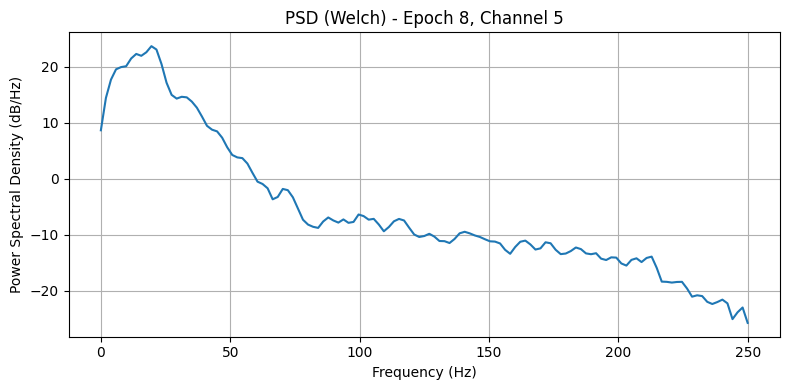

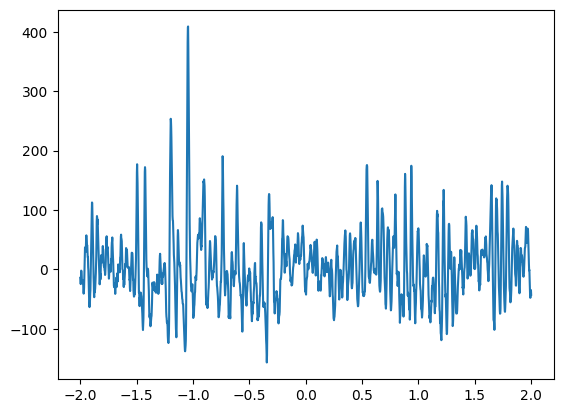

In [85]:
import mne.time_frequency
print(type(event_epochs))
psd, freqs = mne.time_frequency.psd_array_welch(event_epochs[8, :, 5], sfreq=sampling_rate, n_per_seg=128)
plt.figure(figsize=(8, 4))
plt.plot(freqs, 10 * np.log10(psd))  # Convert to dB
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power Spectral Density (dB/Hz)')
plt.title('PSD (Welch) - Epoch 8, Channel 5')
plt.grid(True)
plt.tight_layout()
plt.show()

time_vector = np.linspace(-2, 2, 2000)
plt.plot(time_vector, event_epochs[8, :, 5])

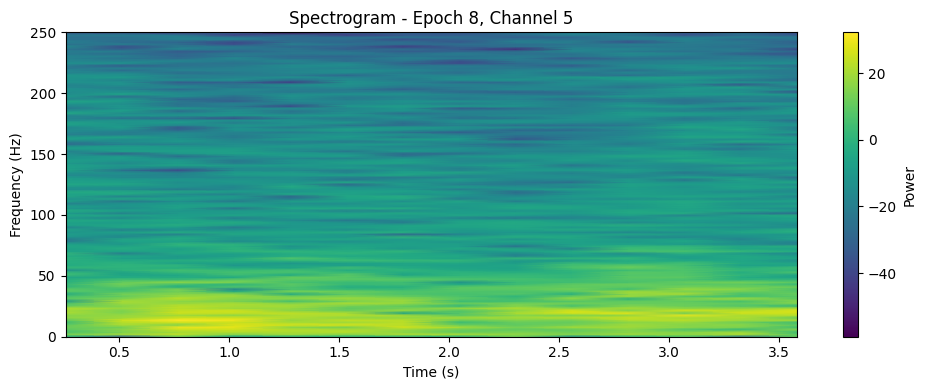

In [88]:
from scipy.signal import spectrogram
import matplotlib.pyplot as plt

# Example: trial 8, channel 5
signal = event_epochs[8, :, 5]
#print(signal.shape)

f, t, Sxx = spectrogram(signal, fs=sampling_rate, nperseg=256, noverlap=128)

plt.figure(figsize=(10, 4))
plt.pcolormesh(t, f, 10 * np.log10(Sxx), shading='gouraud')
plt.ylabel('Frequency (Hz)')
plt.xlabel('Time (s)')
plt.title('Spectrogram - Epoch 8, Channel 5')
plt.colorbar(label='Power')
plt.tight_layout()
plt.show()

In [ ]:
# CHECK THE EXPERIMENTAL SESSIONS OF A SPECIFIC SUBJECT

# get the path to each subject's session behavior/ecephys files
with DandiAPIClient() as client:
    paths = []
    for file in client.get_dandiset("000055", "draft").get_assets_with_path_prefix(""):
        paths.append(file.path)
paths = natsort.natsorted(paths)
# print(paths)
paths

['sub-01/sub-01_ses-3_behavior+ecephys.nwb',
 'sub-01/sub-01_ses-4_behavior+ecephys.nwb',
 'sub-01/sub-01_ses-5_behavior+ecephys.nwb',
 'sub-01/sub-01_ses-7_behavior+ecephys.nwb',
 'sub-02/sub-02_ses-3_behavior+ecephys.nwb',
 'sub-02/sub-02_ses-4_behavior+ecephys.nwb',
 'sub-02/sub-02_ses-5_behavior+ecephys.nwb',
 'sub-02/sub-02_ses-6_behavior+ecephys.nwb',
 'sub-03/sub-03_ses-3_behavior+ecephys.nwb',
 'sub-03/sub-03_ses-4_behavior+ecephys.nwb',
 'sub-03/sub-03_ses-5_behavior+ecephys.nwb',
 'sub-03/sub-03_ses-6_behavior+ecephys.nwb',
 'sub-04/sub-04_ses-3_behavior+ecephys.nwb',
 'sub-04/sub-04_ses-4_behavior+ecephys.nwb',
 'sub-04/sub-04_ses-5_behavior+ecephys.nwb',
 'sub-04/sub-04_ses-6_behavior+ecephys.nwb',
 'sub-04/sub-04_ses-7_behavior+ecephys.nwb',
 'sub-05/sub-05_ses-3_behavior+ecephys.nwb',
 'sub-05/sub-05_ses-4_behavior+ecephys.nwb',
 'sub-05/sub-05_ses-7_behavior+ecephys.nwb',
 'sub-06/sub-06_ses-3_behavior+ecephys.nwb',
 'sub-06/sub-06_ses-4_behavior+ecephys.nwb',
 'sub-06/s